# *** PART I

# 1. Problem statement and business case

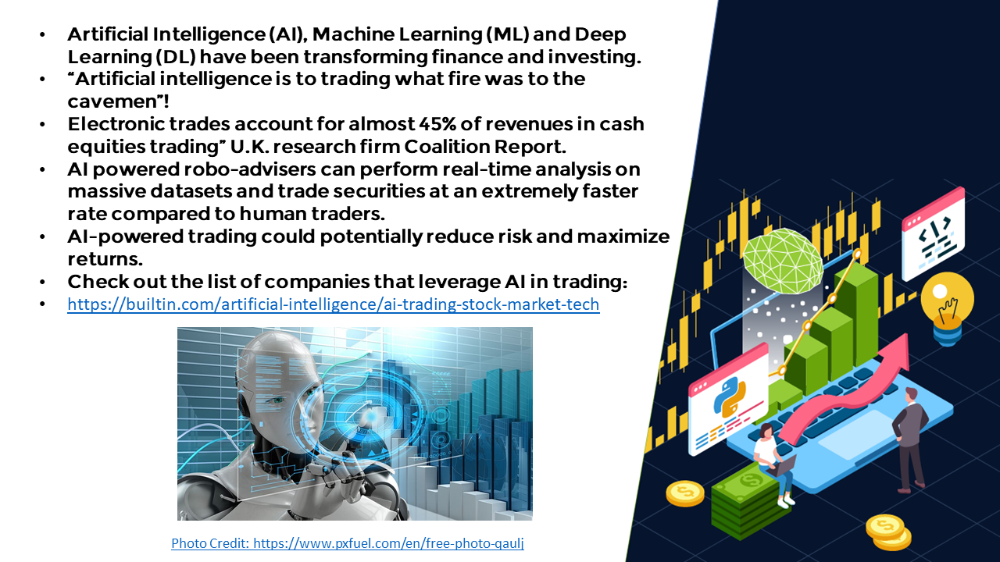

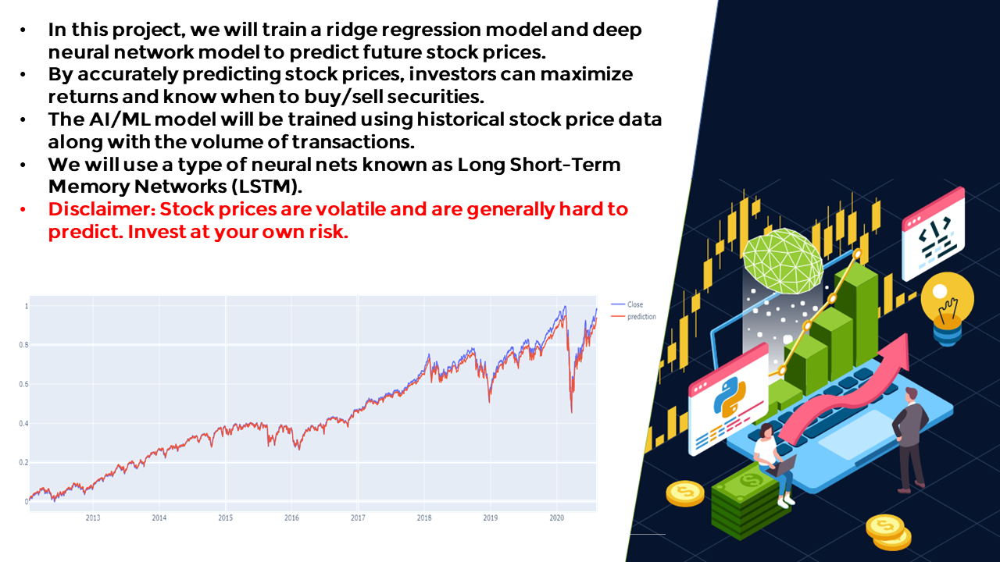

#2. Import datasets and libraries



In [2]:
#Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [3]:
#Import essential libraries
import pandas as pd
import plotly.express as px #data vislualization
from copy import copy
from scipy import stats #stats
import matplotlib.pyplot as plt #data visualization
import numpy as np #numerical analysis / arrays
import plotly.figure_factory as ff #data plotting
from sklearn.linear_model import LinearRegression #plot regression using scikitlearn
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from tensorflow import keras #import specific alogorithms and apply them to case

In [4]:
#Read stock prices data
stock_price_df = pd.read_csv('/content/drive/MyDrive/Stock Predictions/stock.csv')
stock_price_df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.130000,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.350000,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.250000,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.730000,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.800000,194.449997,180.520004,26.760000,318.590851,1314.500000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,440.250000,174.279999,29.850000,16.719999,3205.030029,125.449997,1485.020020,1473.609985,3327.770020
2155,2020-08-06,455.609985,172.199997,29.840000,18.459999,3225.000000,126.120003,1489.579956,1500.099976,3349.159912
2156,2020-08-07,444.450012,170.020004,30.020000,19.030001,3167.459961,124.959999,1452.709961,1494.489990,3351.280029
2157,2020-08-10,450.910004,179.410004,30.200001,21.650000,3148.159912,127.110001,1418.569946,1496.099976,3360.469971


In [5]:
#Read the stocks volume data
stock_volume_df = pd.read_csv('/content/drive/MyDrive/Stock Predictions/stock_volume.csv')
stock_volume_df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,53146800,3934500,26511100,17891100,5385800,6881000,729300,3764400,4019890000
1,2012-01-13,56505400,4641100,22096800,16621800,4753500,5279200,5500400,4631800,3692370000
2,2012-01-17,60724300,3700100,23500200,15480800,5644500,6003400,4651600,3832800,4010490000
3,2012-01-18,69197800,4189500,22015000,18387600,7473500,4600600,1260200,5544000,4096160000
4,2012-01-19,65434600,5397300,25524000,14022900,7096000,8567200,1246300,12657800,4465890000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,30498000,46551000,22991700,18914200,3930000,3675400,4978000,1979500,4732220000
2155,2020-08-06,50607200,32921600,21908700,35867700,3940600,3417100,5992300,1995400,4267490000
2156,2020-08-07,49453300,19301600,30398500,34530300,3929600,3651000,8883500,1576600,4104860000
2157,2020-08-10,53100900,35857700,35514400,71219700,3167300,3968300,7522300,1289300,4318570000


In [6]:
#Sort the data based on 'Date'
stock_price_df = stock_price_df.sort_values('Date')

In [7]:
stock_price_df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.130000,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.350000,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.250000,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.730000,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.800000,194.449997,180.520004,26.760000,318.590851,1314.500000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,440.250000,174.279999,29.850000,16.719999,3205.030029,125.449997,1485.020020,1473.609985,3327.770020
2155,2020-08-06,455.609985,172.199997,29.840000,18.459999,3225.000000,126.120003,1489.579956,1500.099976,3349.159912
2156,2020-08-07,444.450012,170.020004,30.020000,19.030001,3167.459961,124.959999,1452.709961,1494.489990,3351.280029
2157,2020-08-10,450.910004,179.410004,30.200001,21.650000,3148.159912,127.110001,1418.569946,1496.099976,3360.469971


In [8]:
#Sort the volume data based on 'Date'
stock_volume_df = stock_volume_df.sort_values('Date')

In [9]:
stock_volume_df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,53146800,3934500,26511100,17891100,5385800,6881000,729300,3764400,4019890000
1,2012-01-13,56505400,4641100,22096800,16621800,4753500,5279200,5500400,4631800,3692370000
2,2012-01-17,60724300,3700100,23500200,15480800,5644500,6003400,4651600,3832800,4010490000
3,2012-01-18,69197800,4189500,22015000,18387600,7473500,4600600,1260200,5544000,4096160000
4,2012-01-19,65434600,5397300,25524000,14022900,7096000,8567200,1246300,12657800,4465890000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,30498000,46551000,22991700,18914200,3930000,3675400,4978000,1979500,4732220000
2155,2020-08-06,50607200,32921600,21908700,35867700,3940600,3417100,5992300,1995400,4267490000
2156,2020-08-07,49453300,19301600,30398500,34530300,3929600,3651000,8883500,1576600,4104860000
2157,2020-08-10,53100900,35857700,35514400,71219700,3167300,3968300,7522300,1289300,4318570000


In [10]:
#Check null values for both data
stock_price_df.isnull().sum()

Date     0
AAPL     0
BA       0
T        0
MGM      0
AMZN     0
IBM      0
TSLA     0
GOOG     0
sp500    0
dtype: int64

In [11]:
stock_volume_df.isnull().sum()

Date     0
AAPL     0
BA       0
T        0
MGM      0
AMZN     0
IBM      0
TSLA     0
GOOG     0
sp500    0
dtype: int64

In [12]:
#Get stock price dataframe info
stock_price_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2159 entries, 0 to 2158
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2159 non-null   object 
 1   AAPL    2159 non-null   float64
 2   BA      2159 non-null   float64
 3   T       2159 non-null   float64
 4   MGM     2159 non-null   float64
 5   AMZN    2159 non-null   float64
 6   IBM     2159 non-null   float64
 7   TSLA    2159 non-null   float64
 8   GOOG    2159 non-null   float64
 9   sp500   2159 non-null   float64
dtypes: float64(9), object(1)
memory usage: 185.5+ KB


In [13]:
#Get stock volume dataframe info
stock_volume_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2159 entries, 0 to 2158
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Date    2159 non-null   object
 1   AAPL    2159 non-null   int64 
 2   BA      2159 non-null   int64 
 3   T       2159 non-null   int64 
 4   MGM     2159 non-null   int64 
 5   AMZN    2159 non-null   int64 
 6   IBM     2159 non-null   int64 
 7   TSLA    2159 non-null   int64 
 8   GOOG    2159 non-null   int64 
 9   sp500   2159 non-null   int64 
dtypes: int64(9), object(1)
memory usage: 185.5+ KB


* What is the average trading volume for Apple stock?
* What is the maximum trading volume for sp500?
* Which security is traded the most?
* What is the average stock price of the S&P500 over the specified time period?
* What is the maximum price of Tesla Stock?
* What is the maximum trading volume for sp500?

In [14]:
stock_volume_df.describe() #answers

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
count,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03
mean,5.820332e+07,6.419916e+06,2.832131e+07,9.845582e+06,4.102673e+06,4.453090e+06,7.001302e+06,2.498238e+06,3.680732e+09
std,4.568141e+07,9.711873e+06,1.428911e+07,7.295753e+06,2.290722e+06,2.462811e+06,5.781208e+06,1.928407e+06,8.622717e+08
min,1.136200e+07,7.889000e+05,6.862400e+06,9.507000e+05,8.813000e+05,1.193000e+06,3.649000e+05,7.900000e+03,1.248960e+09
25%,2.769930e+07,3.031850e+06,2.002150e+07,5.796450e+06,2.675700e+06,3.111250e+06,3.433450e+06,1.325400e+06,3.211890e+09
50%,4.209420e+07,3.991000e+06,2.485930e+07,7.899800e+06,3.494800e+06,3.825000e+06,5.581100e+06,1.813900e+06,3.526890e+09
75%,7.182480e+07,5.325900e+06,3.210565e+07,1.104055e+07,4.768150e+06,4.937300e+06,8.619550e+06,3.245350e+06,3.933290e+09
max,3.765300e+08,1.032128e+08,1.950827e+08,9.009820e+07,2.385610e+07,3.049020e+07,6.093880e+07,2.497790e+07,9.044690e+09


In [15]:
pd.options.display.float_format = '{:.4f}'.format #global setting/ format scientific notation: https://stackoverflow.com/questions/21137150/format-suppress-scientific-notation-from-pandas-aggregation-results

In [16]:
stock_volume_df.describe()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
count,2159.0000,2159.0000,2159.0000,2159.0000,2159.0000,2159.0000,2159.0000,2159.0000,2159.0000
mean,58203317.4155,6419915.9333,28321313.5711,9845581.7045,4102672.9041,4453089.5322,7001302.2696,2498238.2585,3680732468.7355
std,45681411.9012,9711873.1540,14289105.8976,7295752.6435,2290722.3372,2462811.4478,5781207.8365,1928407.2520,862271696.8442
min,11362000.0000,788900.0000,6862400.0000,950700.0000,881300.0000,1193000.0000,364900.0000,7900.0000,1248960000.0000
25%,27699300.0000,3031850.0000,20021500.0000,5796450.0000,2675700.0000,3111250.0000,3433450.0000,1325400.0000,3211890000.0000
50%,42094200.0000,3991000.0000,24859300.0000,7899800.0000,3494800.0000,3825000.0000,5581100.0000,1813900.0000,3526890000.0000
75%,71824800.0000,5325900.0000,32105650.0000,11040550.0000,4768150.0000,4937300.0000,8619550.0000,3245350.0000,3933290000.0000
max,376530000.0000,103212800.0000,195082700.0000,90098200.0000,23856100.0000,30490200.0000,60938800.0000,24977900.0000,9044690000.0000


In [17]:
# Get the statistical data for the stocks volume dataframe
# Average trading volume for Apple stock is 2.498238e+06
# Average trading volume for S&P500 is 3.680732e+09

# Why S&P500 is the most traded of all? Check out this article:
# https://www.investopedia.com/articles/personal-finance/022216/put-10000-sp-500-etf-and-wait-20-years.asp

# Text from the article above:
# "The S&P 500 index is a broad-based measure of large corporations traded on U.S. stock markets. Over long periods of time,
# passively holding the index often produces better results than actively trading or picking single stocks.
# Over long-time horizons, the index typically produces better returns than actively managed portfolios."

In [18]:
# Get the statistical data for the prices dataframe
stock_price_df.describe()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
count,2159.0000,2159.0000,2159.0000,2159.0000,2159.0000,2159.0000,2159.0000,2159.0000,2159.0000
mean,140.8198,189.9427,35.1629,23.1057,915.6657,161.8530,259.6008,783.7125,2218.7496
std,70.8276,103.6786,3.2075,6.9638,697.8389,25.5619,210.9880,334.4481,537.3217
min,55.7900,67.2400,26.7700,7.1400,175.9300,94.7700,22.7900,278.4812,1278.0400
25%,89.1657,124.0150,33.0400,18.5450,316.4900,142.7700,184.5950,527.2144,1847.9850
50%,116.6000,142.4200,34.9300,23.7800,676.0100,156.9500,231.9600,737.6000,2106.6299
75%,175.0200,297.0450,37.4200,28.4300,1593.6450,185.9750,307.3500,1079.7450,2705.8101
max,455.6100,440.6200,43.4700,38.0300,3225.0000,215.8000,1643.0000,1568.4900,3386.1499


In [19]:
# Average price for S&P500 = 2218.749554
# Maximum Tesla Price = 1643.000000

#3. Perform exploratory data analysis and visulaization

In [20]:
#Function to normalize the stock price based on their initial price
def normalize(df):
  x = df.copy()
  for i in x.columns[1:]:
    x[i] = x[i]/x[i][0]
  return x

In [21]:
#Function to plot interactive plots using Plotly Express
def interactive_plot(df, title):
  fig = px.line(title=title)
  for i in df.columns[1:]:
    fig.add_scatter(x = df['Date'], y = df[i], name = i)
  fig.show()

In [22]:
#Plot interactive chart for stocks data
interactive_plot(stock_price_df, 'Stock Prices')

In [23]:
#Plot interactive chart for stocks data
interactive_plot(stock_volume_df, 'Stock Volume')

In [24]:
#Plot interactive chart for stocks data
interactive_plot(normalize(stock_price_df), 'Normalized Stock Prices')

In [25]:
#Plot interactive chart for stocks data
interactive_plot(normalize(stock_volume_df), 'Normalized Stock Volume')

# 4. Prepare Data before training AI/ML model

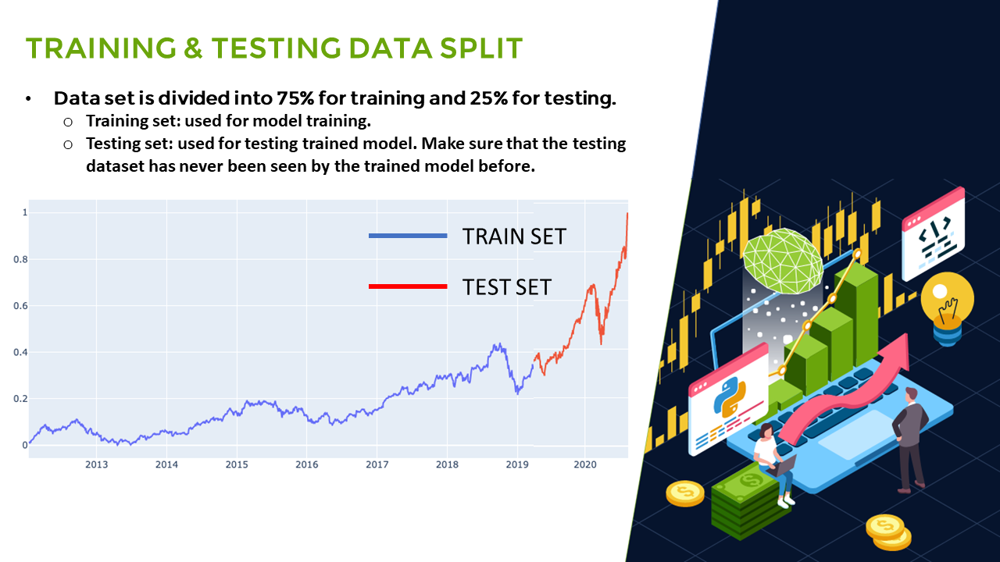

In [26]:
#Function to concatenate the date, stock price, and volume in one dataframe
def individual_stock(price_df, vol_df, name):
  return pd.DataFrame({'Date':price_df['Date'], 'Close':price_df[name], 'Volume':vol_df[name] })

In [27]:
# Function to return the input/output (target) data for AI/ML Model
# Note that our goal is to predict the future stock price
# Target stock price today will be tomorrow's price
def trading_window(data):

  # 1 day window
  n = 1

  # Create a column containing the prices for the next 1 days
  data['Target'] = data[['Close']].shift(-n)

  # return the new dataset
  return data

In [28]:
#Let's test the functions and get individual stock prices and volumes for AAPL
price_volume_df  = individual_stock(stock_price_df, stock_volume_df, 'AAPL')

In [29]:
price_volume_df

,Date,Close,Volume
0,2012-01-12,60.1986,53146800
1,2012-01-13,59.9729,56505400
2,2012-01-17,60.6714,60724300
3,2012-01-18,61.3014,69197800
4,2012-01-19,61.1071,65434600
...,...,...,...
2154,2020-08-05,440.2500,30498000
2155,2020-08-06,455.6100,50607200
2156,2020-08-07,444.4500,49453300
2157,2020-08-10,450.9100,53100900


In [30]:
price_volume_target_df = trading_window(price_volume_df)

In [31]:
price_volume_target_df

,Date,Close,Volume,Target
0,2012-01-12,60.1986,53146800,59.9729
1,2012-01-13,59.9729,56505400,60.6714
2,2012-01-17,60.6714,60724300,61.3014
3,2012-01-18,61.3014,69197800,61.1071
4,2012-01-19,61.1071,65434600,60.0429
...,...,...,...,...
2154,2020-08-05,440.2500,30498000,455.6100
2155,2020-08-06,455.6100,50607200,444.4500
2156,2020-08-07,444.4500,49453300,450.9100
2157,2020-08-10,450.9100,53100900,437.5000


In [32]:
#Remove the last row as it will be a null value
price_volume_target_df = price_volume_target_df[:-1]
price_volume_target_df

,Date,Close,Volume,Target
0,2012-01-12,60.1986,53146800,59.9729
1,2012-01-13,59.9729,56505400,60.6714
2,2012-01-17,60.6714,60724300,61.3014
3,2012-01-18,61.3014,69197800,61.1071
4,2012-01-19,61.1071,65434600,60.0429
...,...,...,...,...
2153,2020-08-04,438.6600,43267900,440.2500
2154,2020-08-05,440.2500,30498000,455.6100
2155,2020-08-06,455.6100,50607200,444.4500
2156,2020-08-07,444.4500,49453300,450.9100


In [33]:
#Scale the data (between 0 and 1 using scikitlearn)
from sklearn.preprocessing import MinMaxScaler #import class
sc = MinMaxScaler(feature_range = (0,1)) #instantiate teh object from the class
price_volume_target_scaled_df = sc.fit_transform(price_volume_target_df.drop(columns = ['Date'])) #apply fit method to the object 'sc'

In [34]:
price_volume_target_scaled_df

array([[0.01102638, 0.11442624, 0.01046185],
       [0.01046185, 0.12362365, 0.01220906],
       [0.01220906, 0.13517696, 0.01378478],
       ...,
       [1.        , 0.10747163, 0.97208751],
       [0.97208751, 0.10431171, 0.98824476],
       [0.98824476, 0.11430054, 0.95470465]])

In [35]:
price_volume_target_scaled_df.shape

(2158, 3)

In [36]:
#Separating input and putput is essential in AI/ML model while training

In [37]:
# Create feature and target
x = price_volume_target_scaled_df[:, :2]
y = price_volume_target_scaled_df[:, 2:]


In [38]:
x

array([[0.01102638, 0.11442624],
       [0.01046185, 0.12362365],
       [0.01220906, 0.13517696],
       ...,
       [1.        , 0.10747163],
       [0.97208751, 0.10431171],
       [0.98824476, 0.11430054]])

In [39]:
y

array([[0.01046185],
       [0.01220906],
       [0.01378478],
       ...,
       [0.97208751],
       [0.98824476],
       [0.95470465]])

In [40]:
x.shape

(2158, 2)

In [41]:
y.shape

(2158, 1)

In [42]:
split = int(0.65 * len(x)) #number of samples fo training out of 2158
split

1402

In [43]:
#Spliting the data this way, since order is important in time-series
#Note that we did not use train test split with it's default settings since it shuffles the data
split = int(0.65 * len(x))
x_train = x[:split]
y_train = y[:split]
x_test = x[split:]
y_test = y[split:]

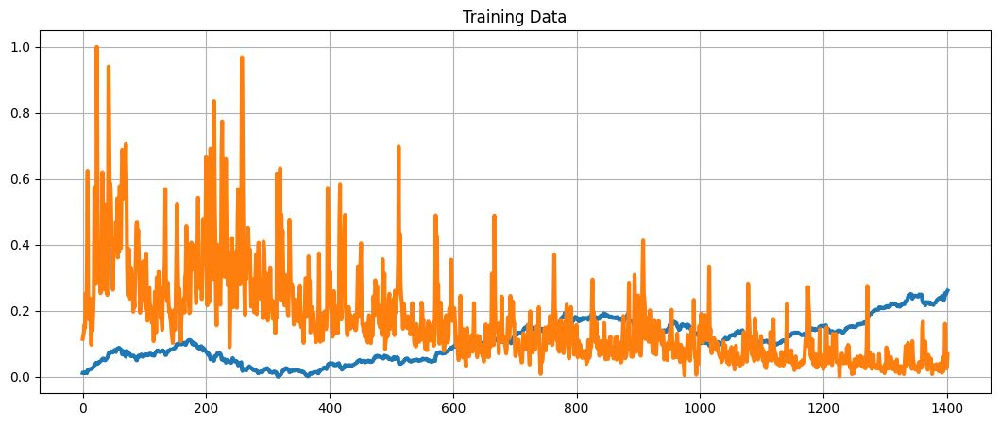

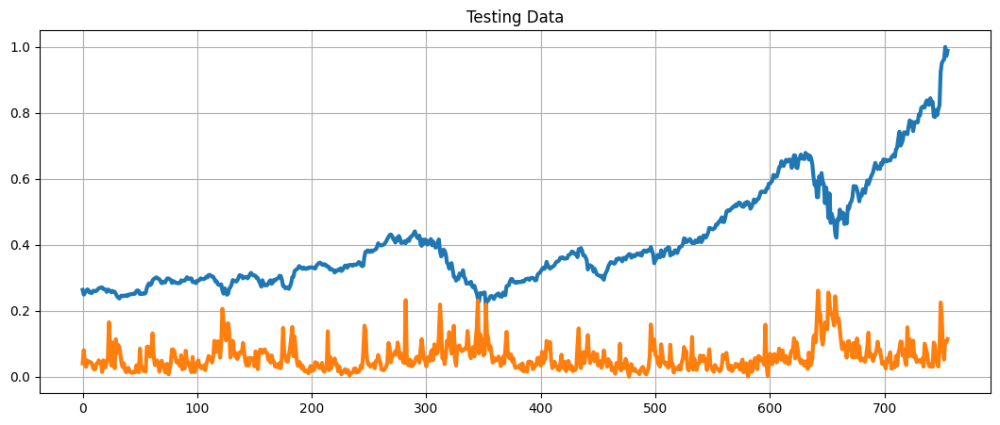

In [44]:
# Define a data plotting function
def show_plot(data, title):
  plt.figure(figsize = (13, 5))
  plt.plot(data, linewidth = 3)
  plt.title(title)
  plt.grid()

show_plot(x_train, 'Training Data')
show_plot(x_test, 'Testing Data')


Test the created pipeline with Amazon: price_volume_df  = individual_stock(stock_price_df, stock_volume_df, 'AMZN')


# *** PART II

# 5.  A - Theory and intuition behind REGRESSION

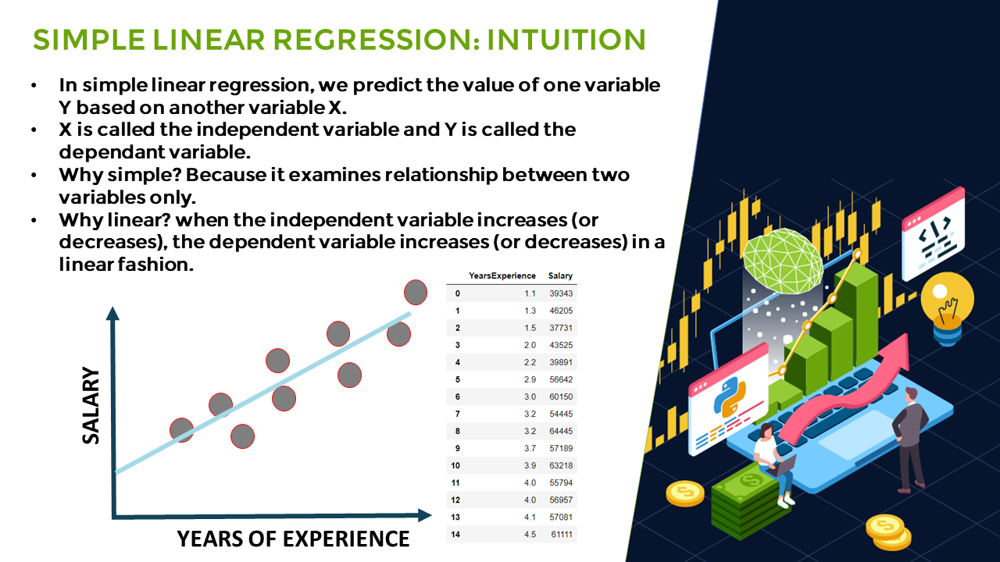

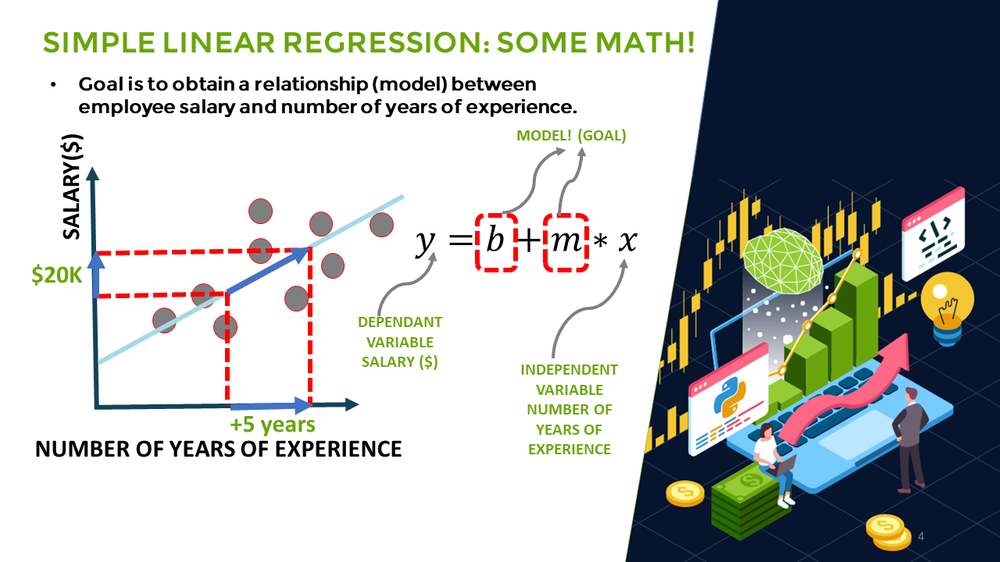

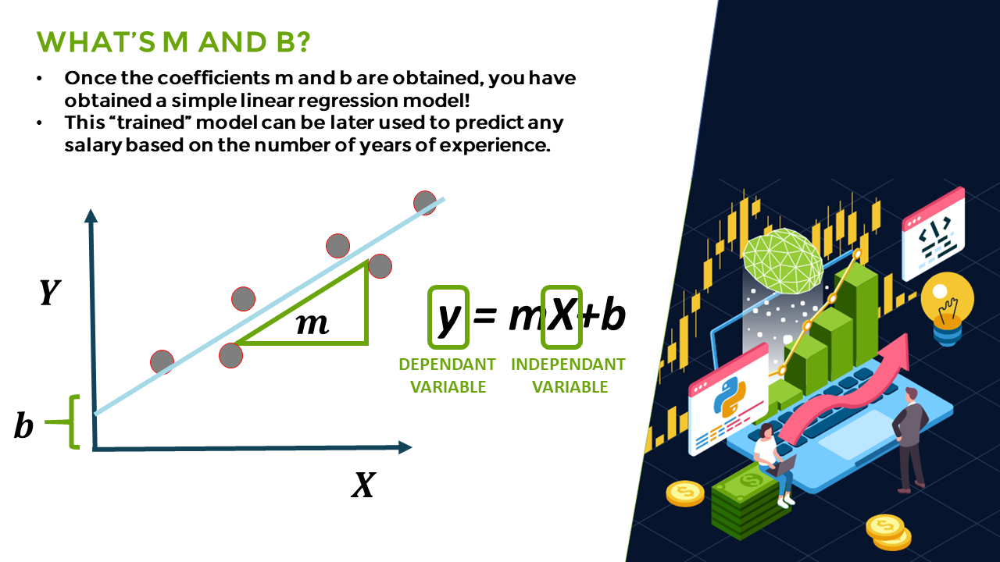

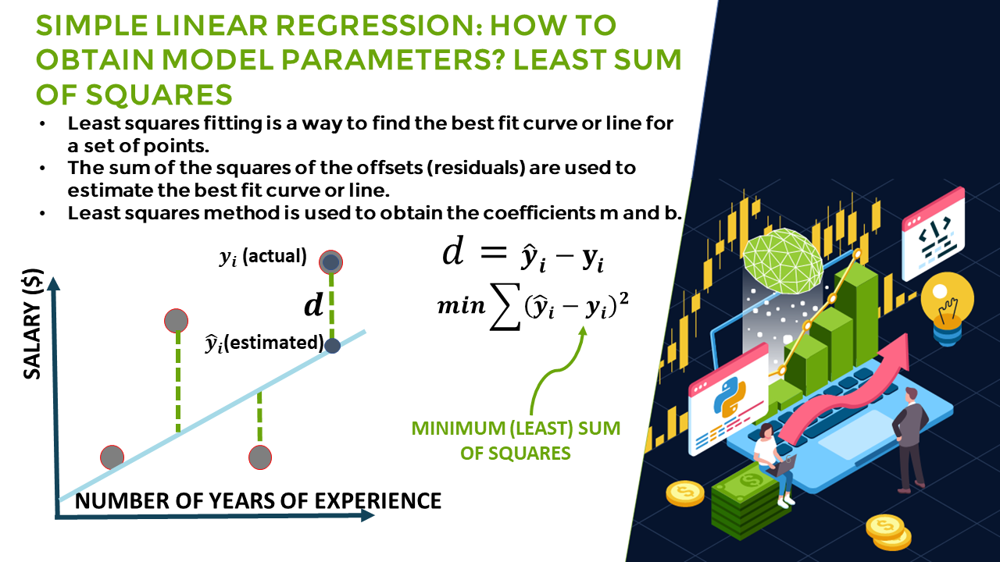

# 6. Concept of REGULARIZATION and RIDGE REGRESSION MODEL

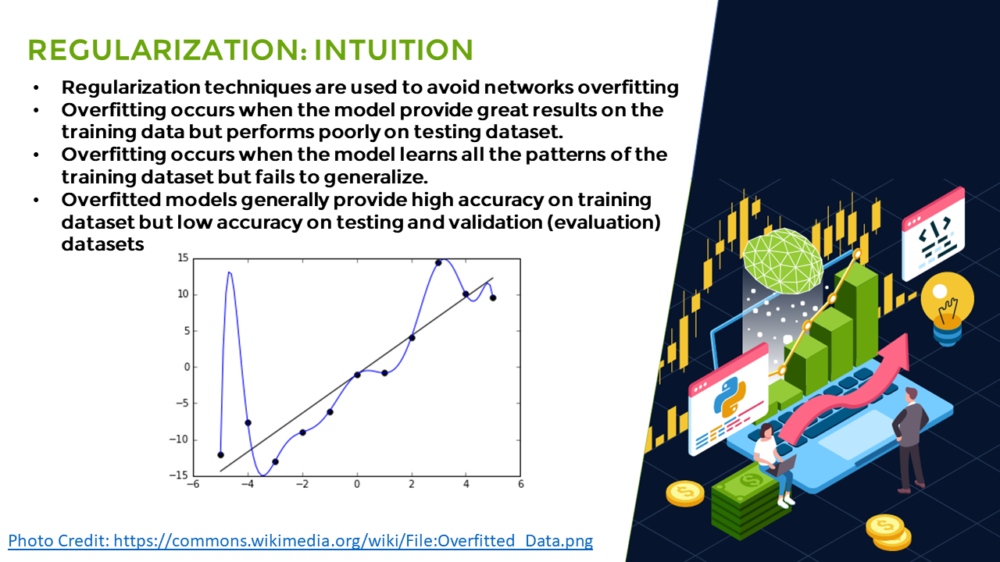

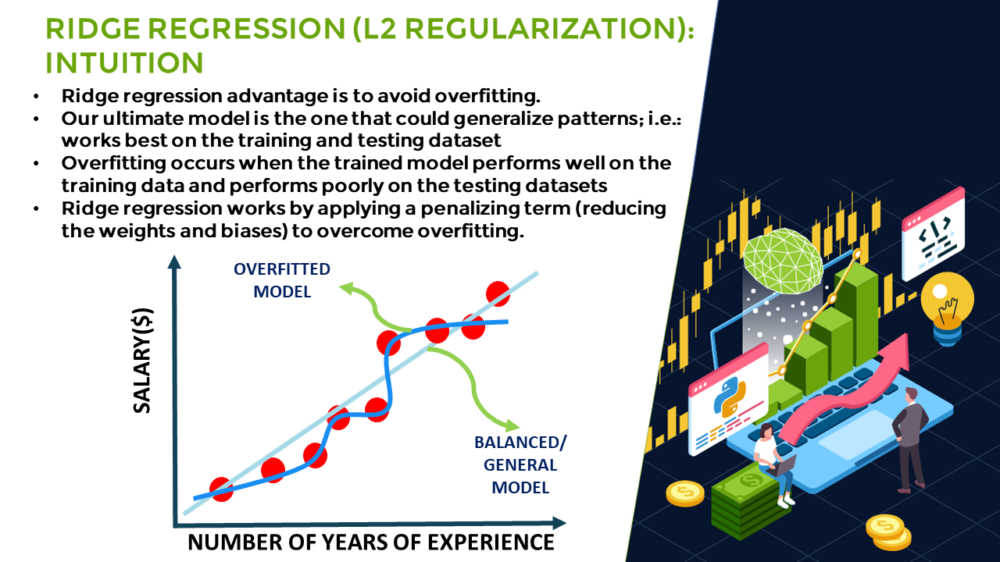

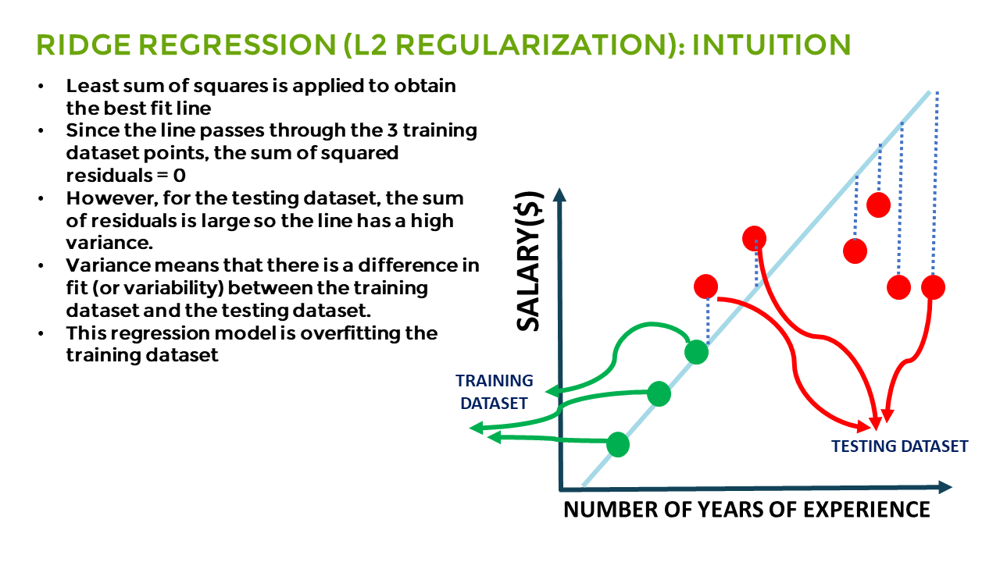

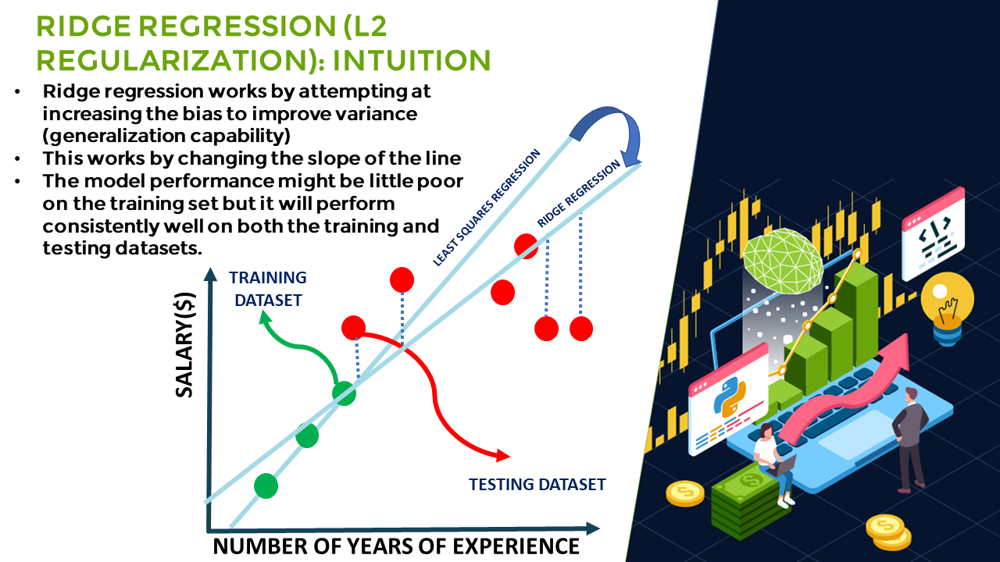

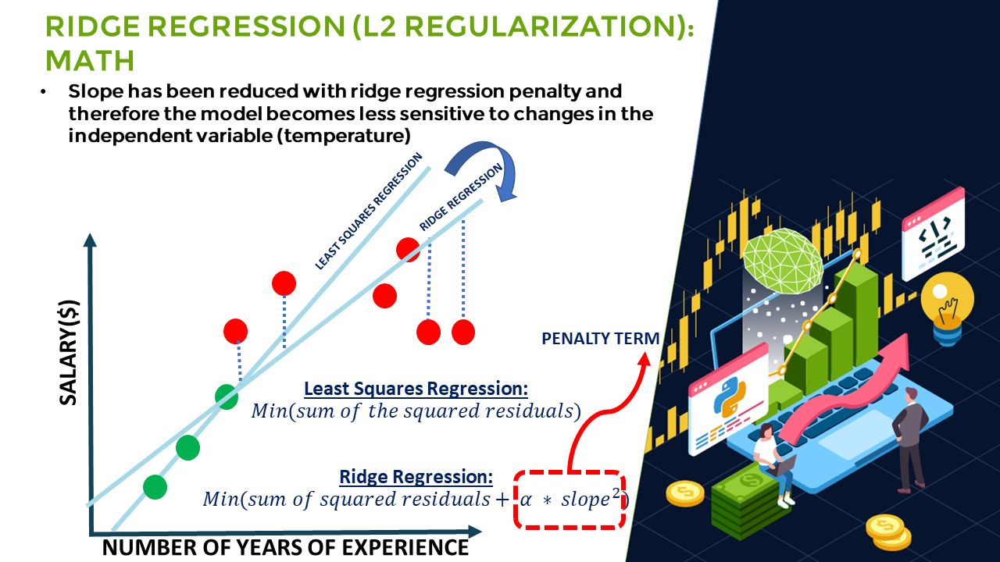

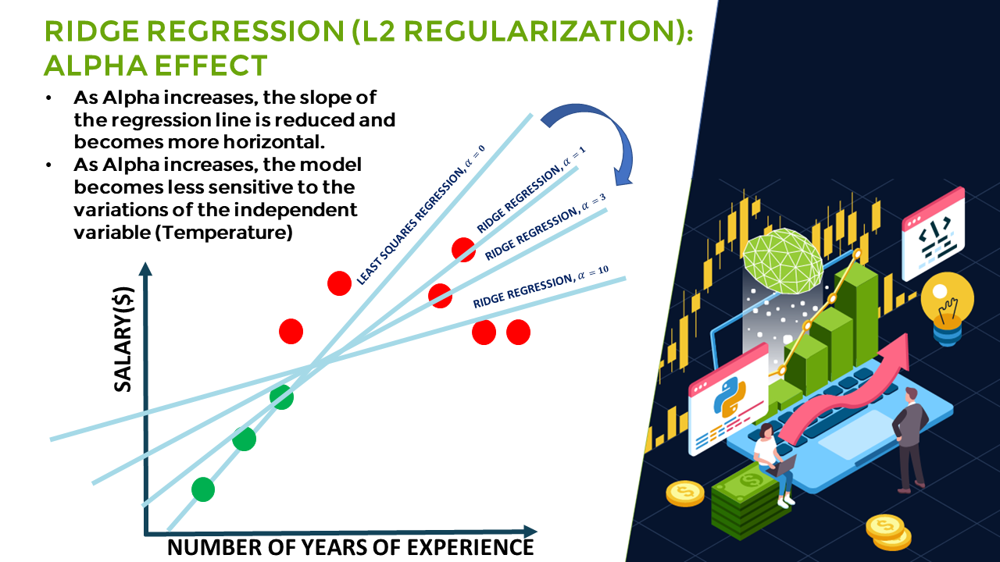

# 7. Build and train a ridge regression model

In [45]:
from sklearn.linear_model import Ridge
#Ridge regression performs linear least squares with L2 regularization
#Create and train the Ridge Linear Reression Model

regression_model = Ridge()

regression_model.fit(x_train, y_train)


Ridge()

In [46]:
#Test model and calculate its accuracy
lr_accuracy = regression_model.score(x_test, y_test)
print('Ridge Regression Score:', lr_accuracy)

Ridge Regression Score: 0.7950028030821767


In [47]:
#Make prediction
predicted_prices = regression_model.predict(x)
predicted_prices

array([[0.03466412],
       [0.03374627],
       [0.03451936],
       ...,
       [0.81048342],
       [0.78876033],
       [0.80091324]])

In [48]:
#Apend the predicted values into a list
predicted = []
for i in predicted_prices:
  predicted.append(i[0])

In [49]:
len(predicted)

2158

In [50]:
#Append the close values(price) to the list
close = []
for i in price_volume_target_scaled_df:
  close.append(i[0])

In [51]:
#Create a dataframe based on the dates in the individual stock data
df_predicted = price_volume_target_df[['Date']]
df_predicted

,Date
0,2012-01-12
1,2012-01-13
2,2012-01-17
3,2012-01-18
4,2012-01-19
...,...
2153,2020-08-04
2154,2020-08-05
2155,2020-08-06
2156,2020-08-07


In [52]:
#Add the close values to the dataframe
df_predicted['Close'] = close
df_predicted

,Date,Close
0,2012-01-12,0.0110
1,2012-01-13,0.0105
2,2012-01-17,0.0122
3,2012-01-18,0.0138
4,2012-01-19,0.0133
...,...,...
2153,2020-08-04,0.9576
2154,2020-08-05,0.9616
2155,2020-08-06,1.0000
2156,2020-08-07,0.9721


In [53]:
# Add the predicted values to the dataframe
df_predicted['Prediction'] = predicted
df_predicted

,Date,Close,Prediction
0,2012-01-12,0.0110,0.0347
1,2012-01-13,0.0105,0.0337
2,2012-01-17,0.0122,0.0345
3,2012-01-18,0.0138,0.0346
4,2012-01-19,0.0133,0.0347
...,...,...,...
2153,2020-08-04,0.9576,0.7783
2154,2020-08-05,0.9616,0.7832
2155,2020-08-06,1.0000,0.8105
2156,2020-08-07,0.9721,0.7888


In [54]:
#Plot the results
interactive_plot(df_predicted, 'Original vs Predictios')

#8. B - Theory and intuion behind NEURAL NETWORKS

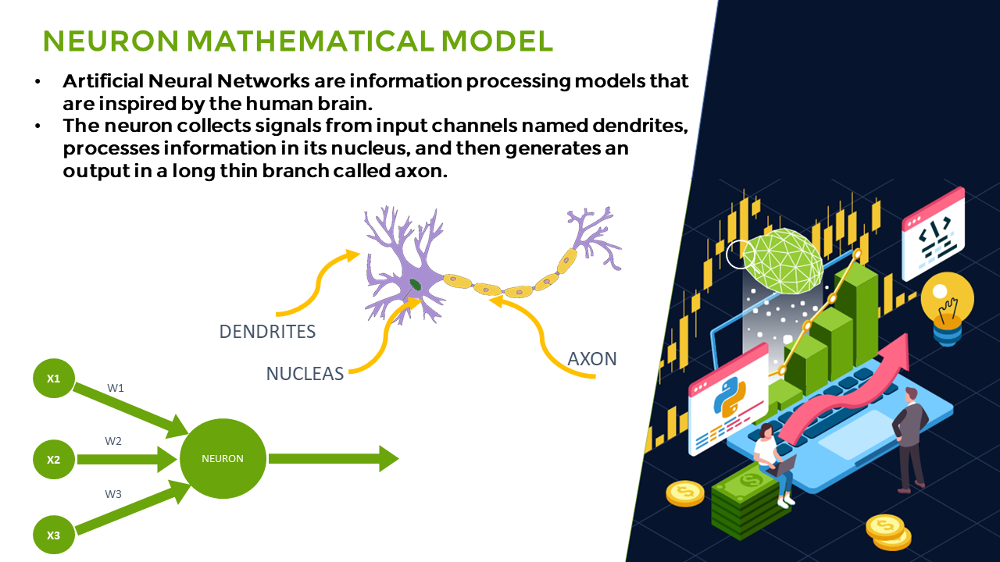

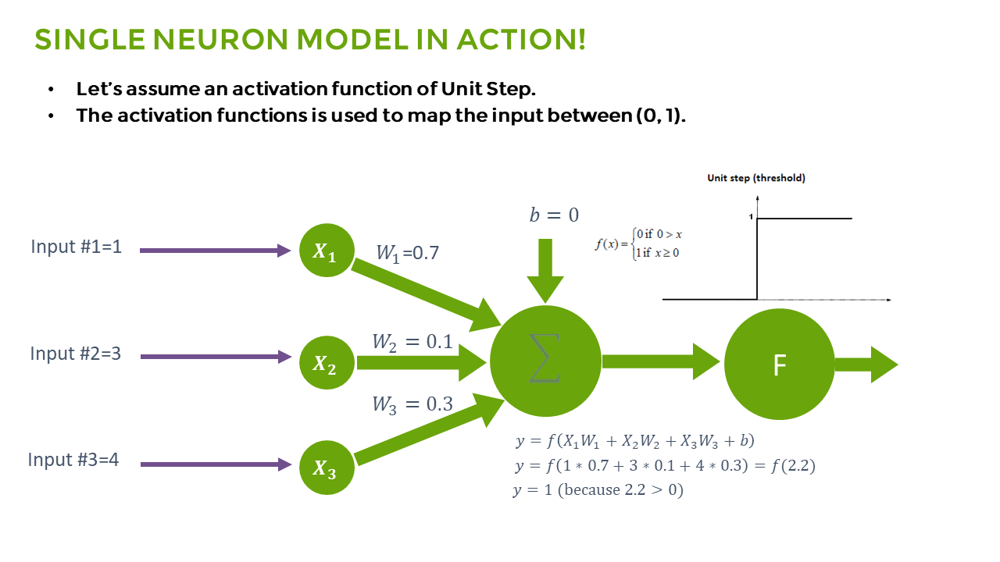

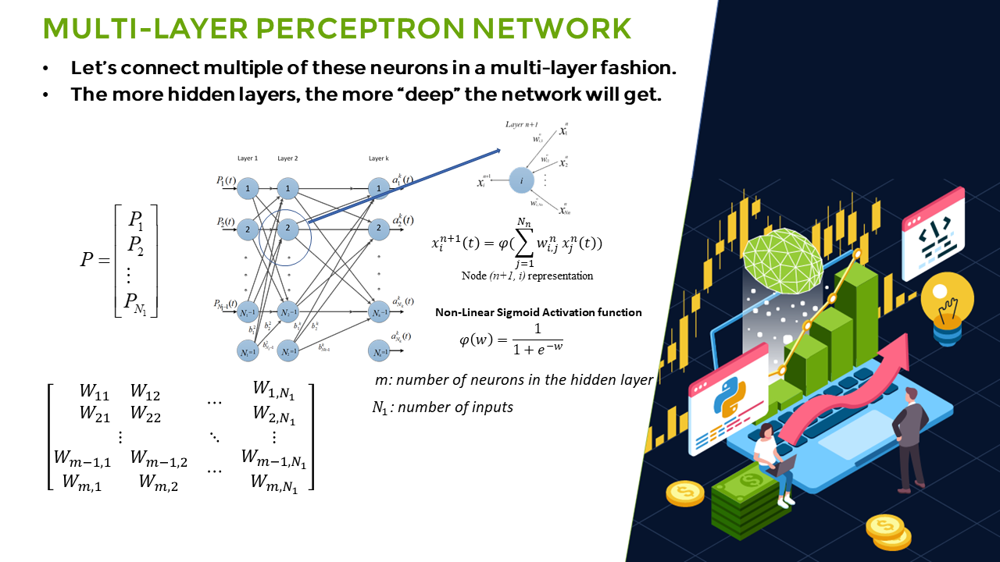

# 9. How do ARTIFIACL NEURAL NETWORKS TRAIN?

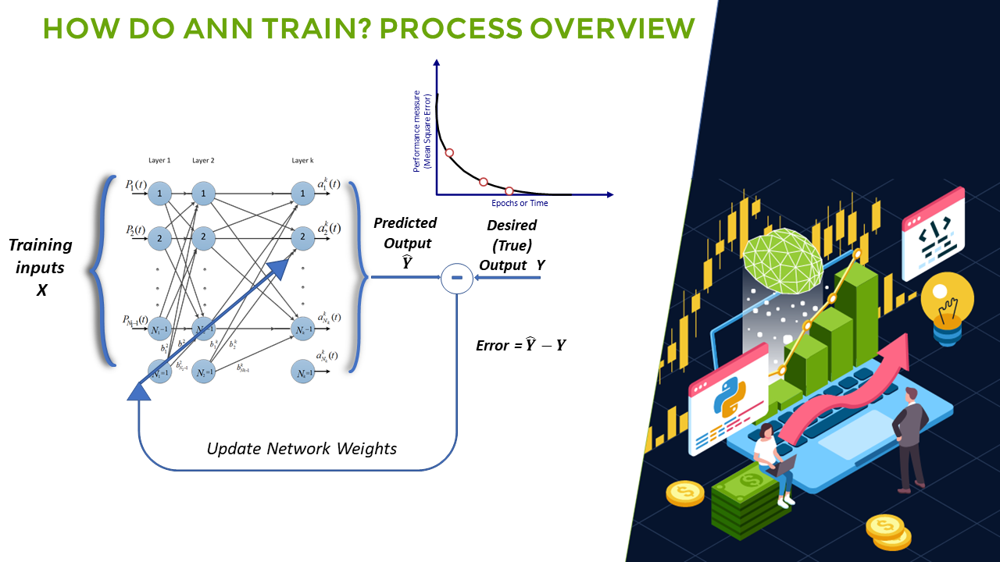

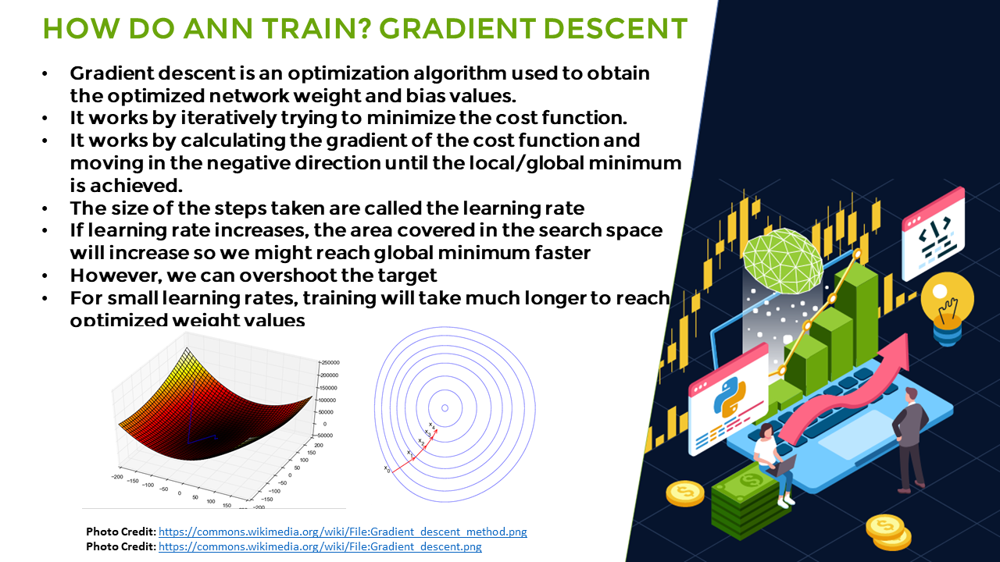

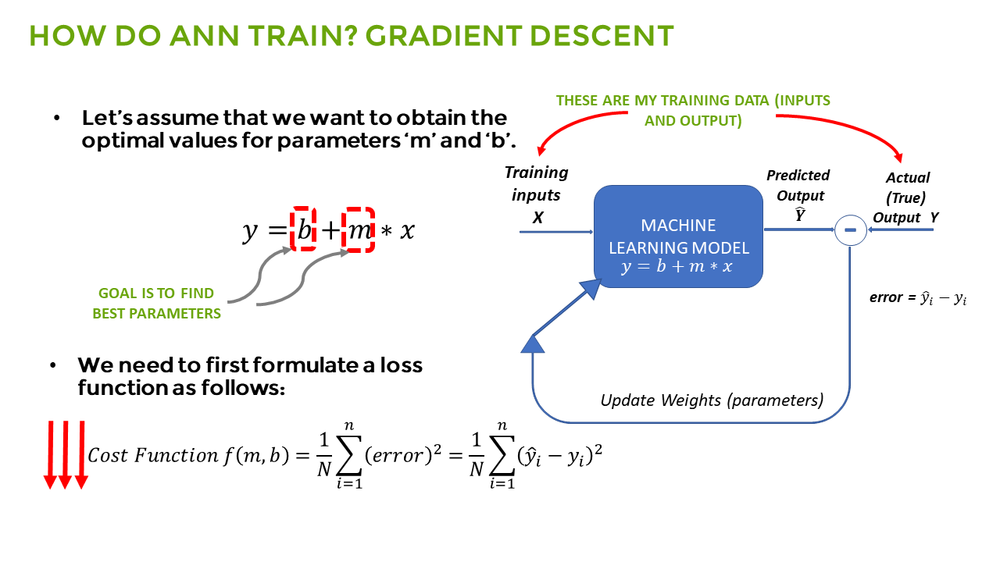

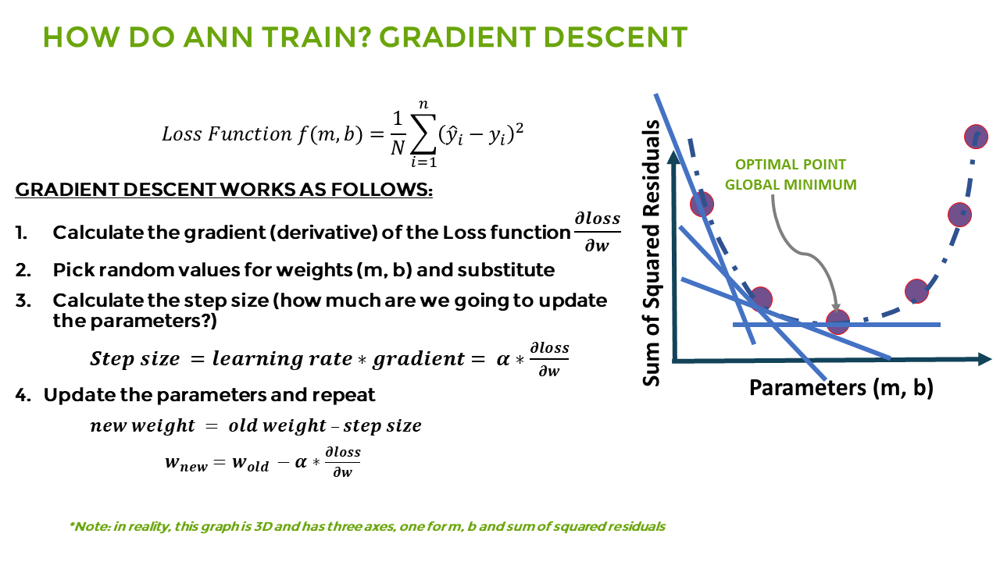

# 10. C - Theory and intuition behind RECURRENT NEURAL NETWORKS

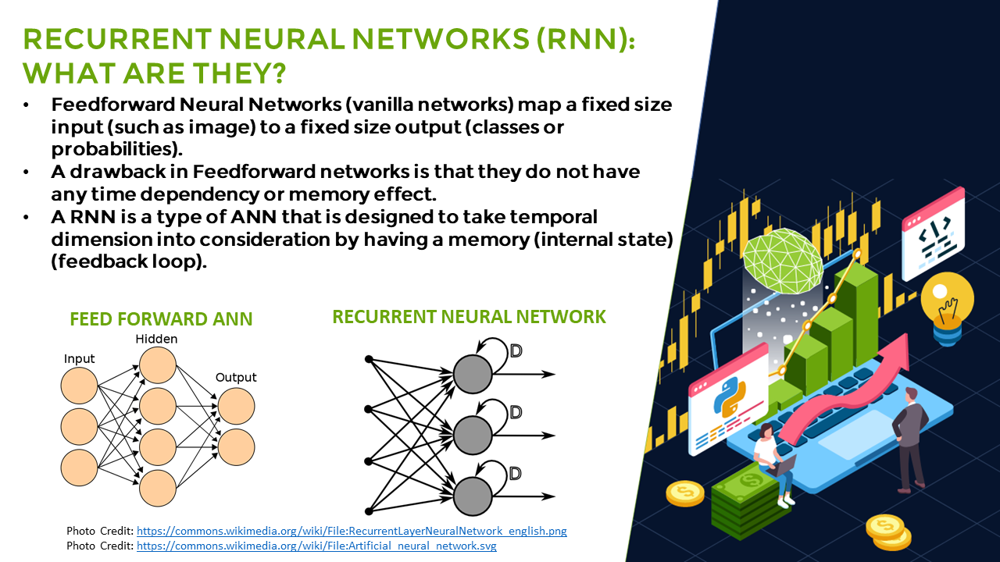

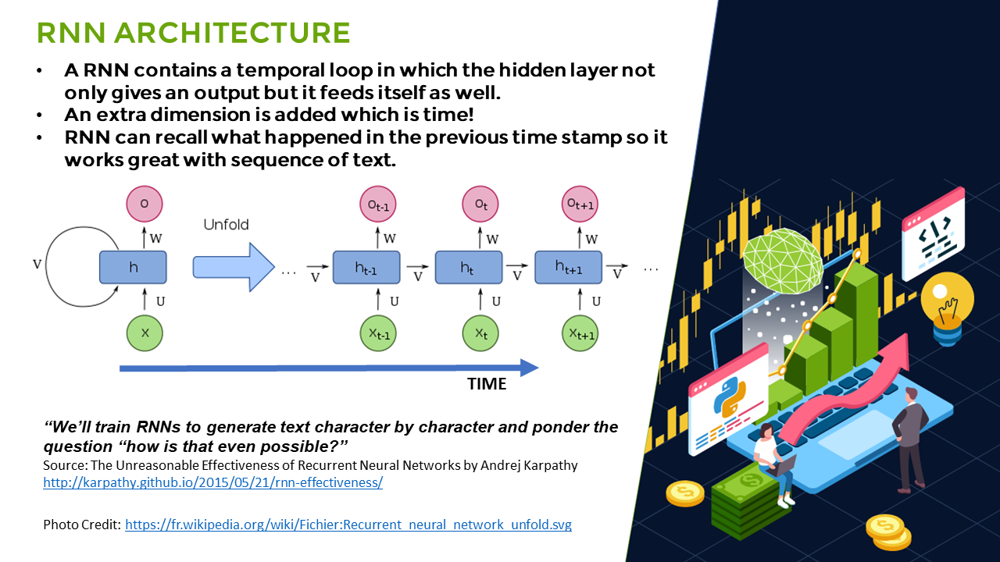

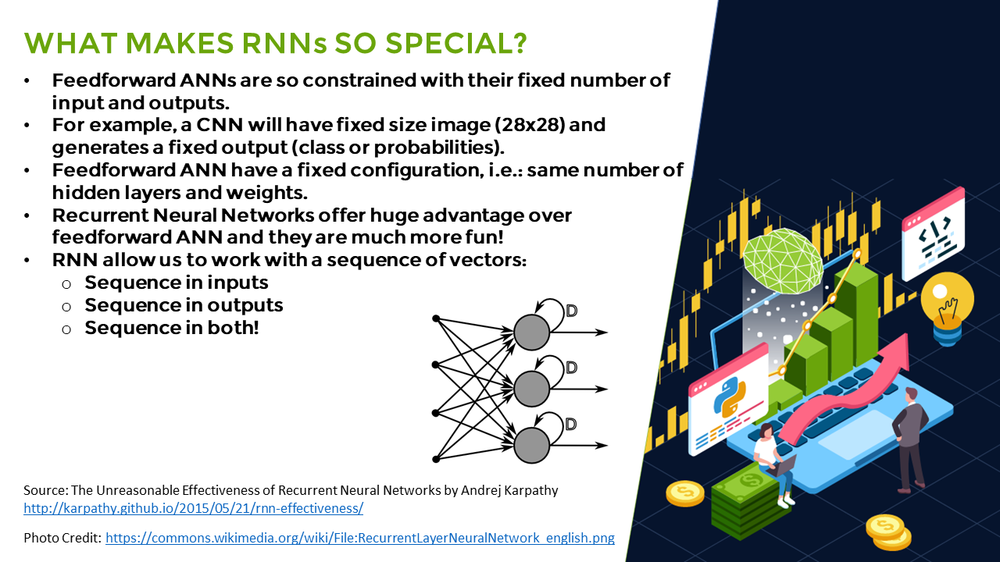

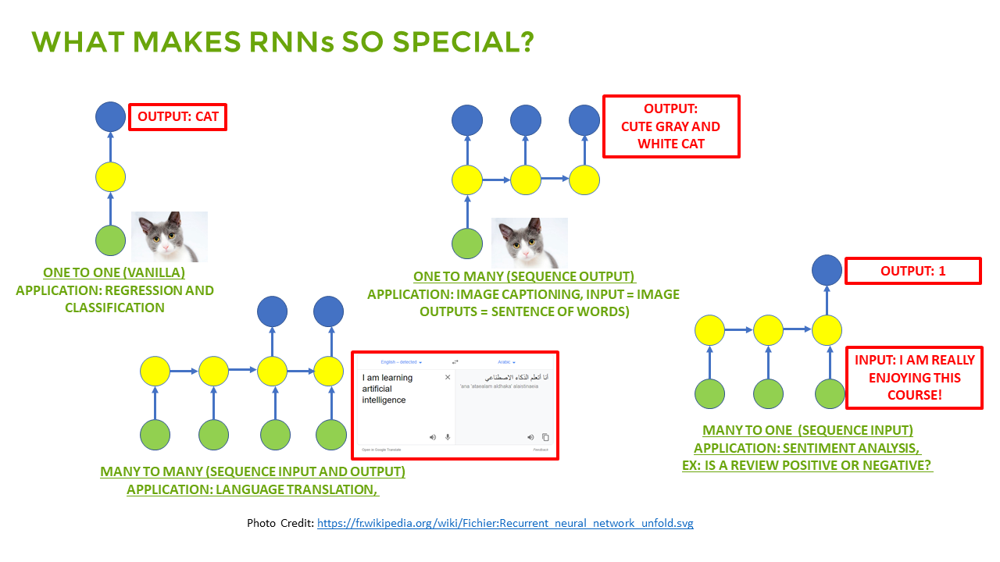

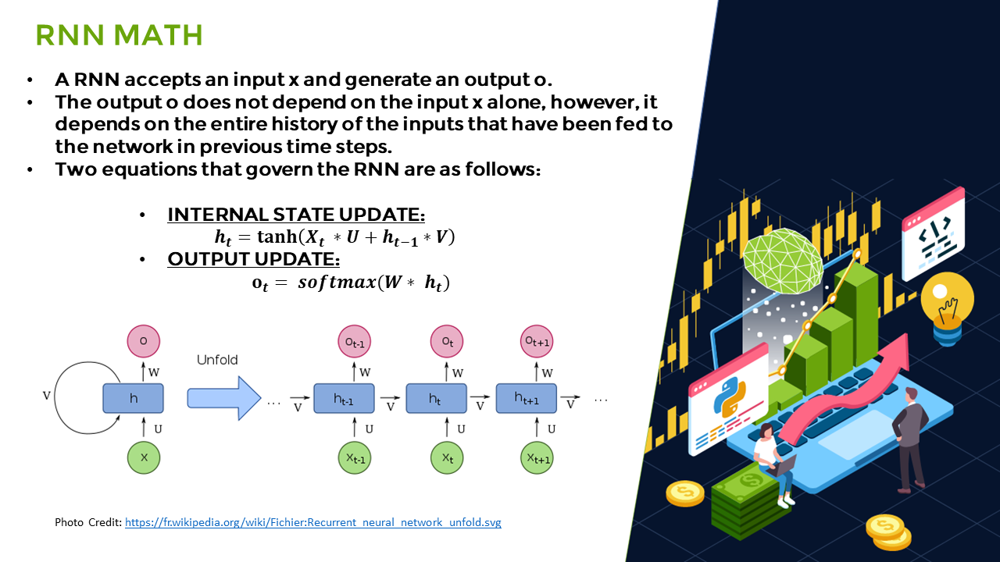

# 11. D - Theory and intuition behind LSTM - Long Short Term Memory Networks

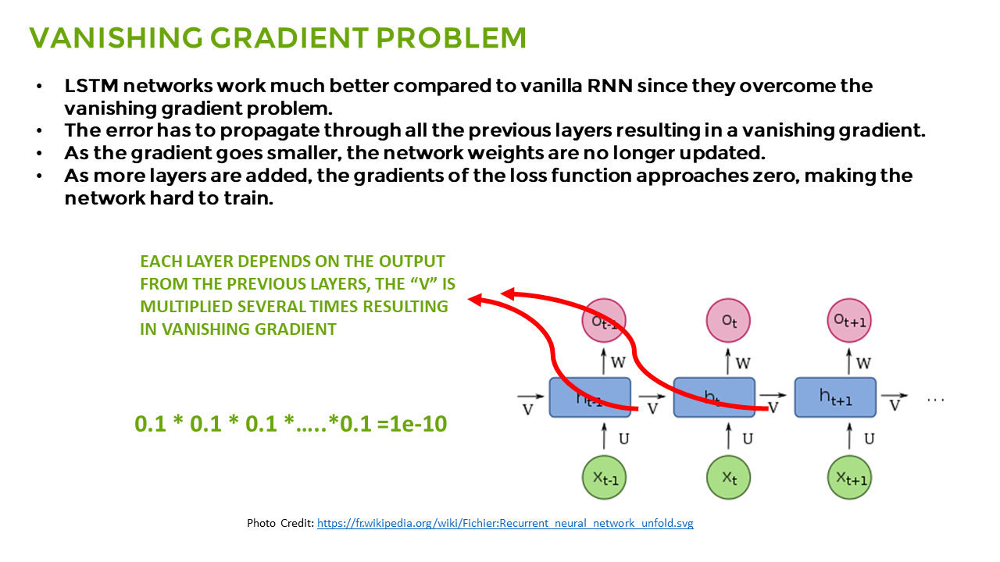

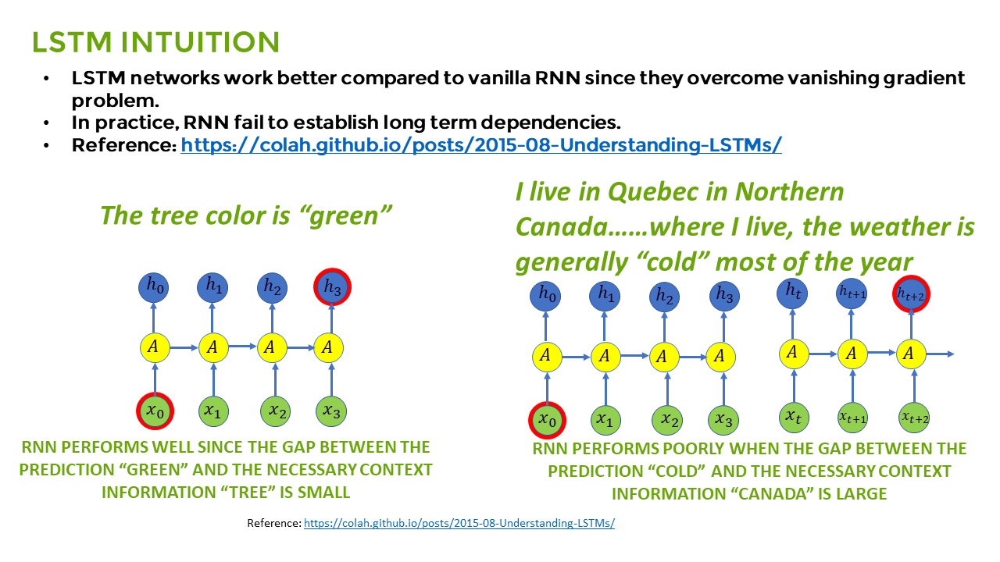

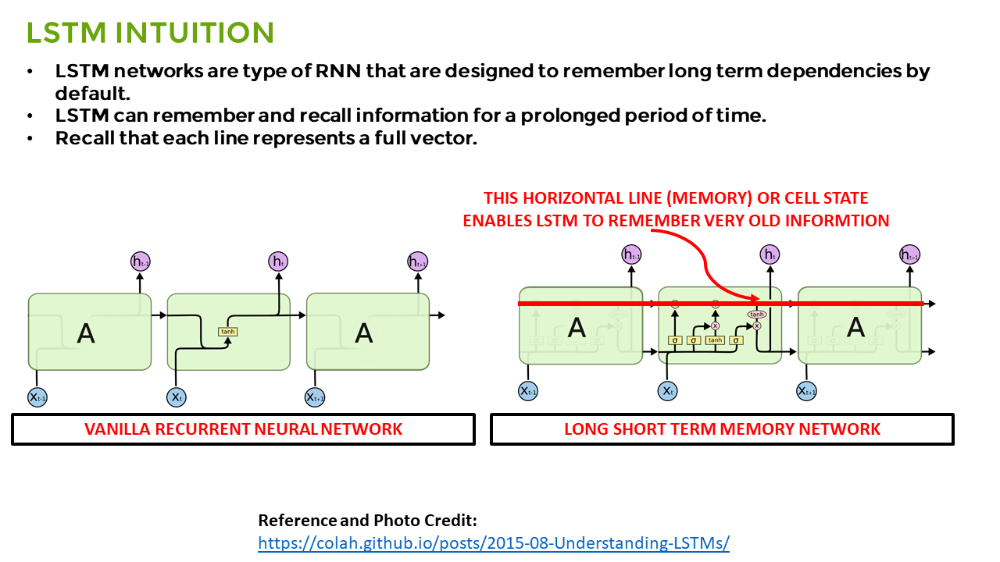

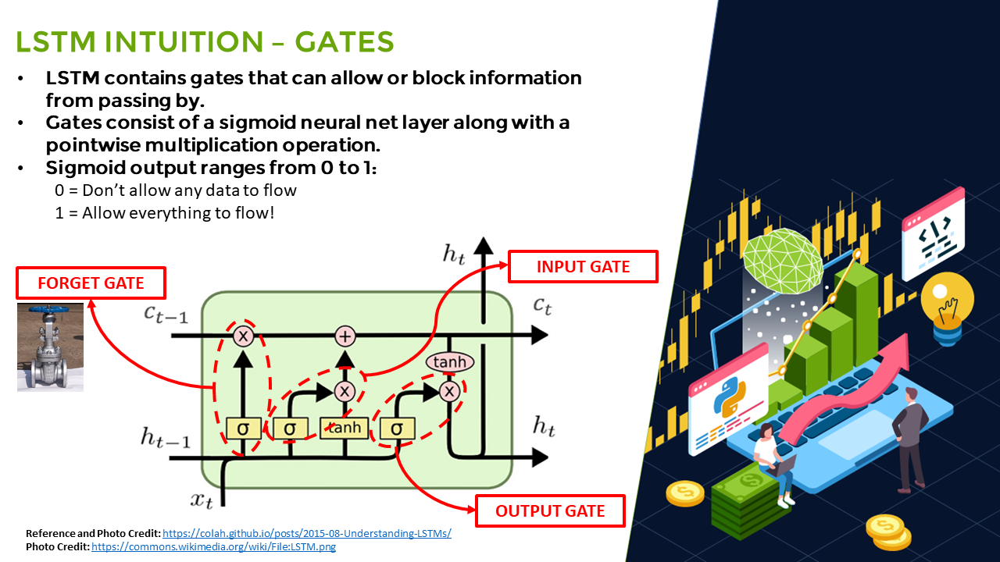

#12. Train an LSTM TIME SERIES MODEL

In [55]:
#Testing the function and get individual stock prices and volumes for AAPL
price_volume_df = individual_stock(stock_price_df, stock_volume_df, 'sp500')
price_volume_df

,Date,Close,Volume
0,2012-01-12,1295.5000,4019890000
1,2012-01-13,1289.0900,3692370000
2,2012-01-17,1293.6700,4010490000
3,2012-01-18,1308.0400,4096160000
4,2012-01-19,1314.5000,4465890000
...,...,...,...
2154,2020-08-05,3327.7700,4732220000
2155,2020-08-06,3349.1599,4267490000
2156,2020-08-07,3351.2800,4104860000
2157,2020-08-10,3360.4700,4318570000


In [60]:
#Get the close and volume data as training data (Input)
training_data = price_volume_df.iloc[:, 1:3].values
training_data

array([[1.29550000e+03, 4.01989000e+09],
       [1.28908997e+03, 3.69237000e+09],
       [1.29367004e+03, 4.01049000e+09],
       ...,
       [3.35128003e+03, 4.10486000e+09],
       [3.36046997e+03, 4.31857000e+09],
       [3.33368994e+03, 5.08765000e+09]])

In [57]:
#Normalize the data
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler(feature_range = (0, 1))
training_set_scaled = sc.fit_transform(training_data)


In [61]:
training_set_scaled

array([[0.00828228, 0.35544202],
       [0.00524163, 0.31342927],
       [0.00741423, 0.35423623],
       ...,
       [0.98345918, 0.36634157],
       [0.9878185 , 0.3937553 ],
       [0.97511517, 0.49240931]])

In [70]:
training_set_scaled [1-1:1, 0]

array([0.00828228])

In [74]:
training_set_scaled [2, 0]

0.00741422696906191

In [75]:
#Create training and test data, training data cintains present day and previous day values
X = []
Y = []
for i in range(1, len(price_volume_df)):
  X.append(training_set_scaled [i-1:i, 0])
  Y.append(training_set_scaled[i,0])

In [163]:
X[:5]

[array([0.00828228]),
 array([0.00524163]),
 array([0.00741423]),
 array([0.01423076]),
 array([0.0172951])]

In [149]:
Y[:5]

array([[0.01046185],
       [0.01220906],
       [0.01378478],
       [0.01329884],
       [0.01063693]])

In [150]:
#Convert the data into array format
X = np.asarray(X)
Y = np.asarray(Y)

In [151]:
X

array([[0.00828228],
       [0.00524163],
       [0.00741423],
       ...,
       [0.98245348],
       [0.98345918],
       [0.9878185 ]])

In [152]:
Y

array([[0.01046185],
       [0.01220906],
       [0.01378478],
       ...,
       [0.97208751],
       [0.98824476],
       [0.95470465]])

In [153]:
#Split the data
split = int(0.7 * len(X))
X_train = X[:split]
Y_train = Y[:split]
X_test = X[split:]
Y_test = Y[split:]

In [154]:
#Reshape the 1D arrays to 3D arrays to feed in the model
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape (X_test, (X_test.shape[0], X_test.shape[1], 1))
X_train.shape, X_test.shape

((1510, 1, 1), (648, 1, 1))

In [224]:
#Create the model
inputs = keras.layers.Input(shape = (X_train.shape[1], X_train.shape[2]))
x = keras.layers.LSTM(150, return_sequences=True)(inputs) #return sequence for dimensionality
x = keras.layers.LSTM(150, return_sequences=True)(x)
x = keras.layers.LSTM(150, return_sequences=True)(x)
outputs = keras.layers.Dense(1, activation='linear')(x) #specify activation function

model = keras.Model(inputs = inputs, outputs = outputs)
model.compile(optimizer='adam', loss='mse') #here compile the model using optimizer
model.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 1, 1)]            0         
                                                                 
 lstm_12 (LSTM)              (None, 1, 150)            91200     
                                                                 
 lstm_13 (LSTM)              (None, 1, 150)            180600    
                                                                 
 lstm_14 (LSTM)              (None, 1, 150)            180600    
                                                                 
 dense_4 (Dense)             (None, 1, 1)              151       
                                                                 
Total params: 452551 (1.73 MB)
Trainable params: 452551 (1.73 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [221]:
Y_train.size

1510

In [218]:
X_train.size

1510

In [284]:
import keras.callbacks

In [286]:
from keras.callbacks import EarlyStopping

In [307]:
es = EarlyStopping(monitor='val_loss',patience=3, mode='min', verbose=1)

In [308]:
#Train the model
history = model.fit(X_train, Y_train, epochs = 16, batch_size=32, validation_split=0.3, callbacks=[es])

Epoch 1/16
34/34 [==============================] - 1s 35ms/step - loss: 4.2712e-04 - val_loss: 0.0620
Epoch 2/16
34/34 [==============================] - 1s 29ms/step - loss: 4.5775e-04 - val_loss: 0.0716
Epoch 3/16
34/34 [==============================] - 1s 32ms/step - loss: 4.3589e-04 - val_loss: 0.0483
Epoch 4/16
34/34 [==============================] - 1s 35ms/step - loss: 4.7910e-04 - val_loss: 0.0411
Epoch 5/16
34/34 [==============================] - 1s 23ms/step - loss: 5.1918e-04 - val_loss: 0.0349
Epoch 6/16
34/34 [==============================] - 1s 29ms/step - loss: 4.7520e-04 - val_loss: 0.0491
Epoch 7/16
34/34 [==============================] - 1s 28ms/step - loss: 4.3877e-04 - val_loss: 0.0585
Epoch 8/16
34/34 [==============================] - 1s 29ms/step - loss: 4.2870e-04 - val_loss: 0.0533
Epoch 8: early stopping


In [309]:
#Make prediction
predictions = model.predict(X)

68/68 [==============================] - 1s 8ms/step


In [310]:
predictions

array([[[0.0758376 ]],

       [[0.07724209]],

       [[0.07623682]],

       ...,

       [[1.7738922 ]],

       [[1.776993  ]],

       [[1.7904187 ]]], dtype=float32)

In [311]:
#Append the predicted values to the list
test_predicted = []
for i in predictions:
  test_predicted.append(i[0])

In [312]:
#Predictions
test_predicted

[array([0.0758376], dtype=float32),
 array([0.07724209], dtype=float32),
 array([0.07623682], dtype=float32),
 array([0.07313998], dtype=float32),
 array([0.0717768], dtype=float32),
 array([0.07159255], dtype=float32),
 array([0.07146292], dtype=float32),
 array([0.07174537], dtype=float32),
 array([0.06938384], dtype=float32),
 array([0.07095651], dtype=float32),
 array([0.07139399], dtype=float32),
 array([0.07208959], dtype=float32),
 array([0.07221583], dtype=float32),
 array([0.06978736], dtype=float32),
 array([0.06949019], dtype=float32),
 array([0.06561636], dtype=float32),
 array([0.06572789], dtype=float32),
 array([0.0651972], dtype=float32),
 array([0.06463348], dtype=float32),
 array([0.06425039], dtype=float32),
 array([0.06605938], dtype=float32),
 array([0.06428494], dtype=float32),
 array([0.06452933], dtype=float32),
 array([0.0659435], dtype=float32),
 array([0.06309021], dtype=float32),
 array([0.06248997], dtype=float32),
 array([0.0623066], dtype=float32),
 array

In [313]:
price_volume_df

,Date,Close,Volume
0,2012-01-12,1295.5000,4019890000
1,2012-01-13,1289.0900,3692370000
2,2012-01-17,1293.6700,4010490000
3,2012-01-18,1308.0400,4096160000
4,2012-01-19,1314.5000,4465890000
...,...,...,...
2154,2020-08-05,3327.7700,4732220000
2155,2020-08-06,3349.1599,4267490000
2156,2020-08-07,3351.2800,4104860000
2157,2020-08-10,3360.4700,4318570000


In [314]:
df_predicted = price_volume_df[1:][['Date','Close']]
df_predicted

,Date,Close
1,2012-01-13,1289.0900
2,2012-01-17,1293.6700
3,2012-01-18,1308.0400
4,2012-01-19,1314.5000
5,2012-01-20,1315.3800
...,...,...
2154,2020-08-05,3327.7700
2155,2020-08-06,3349.1599
2156,2020-08-07,3351.2800
2157,2020-08-10,3360.4700


In [315]:
#Append prediction in the dataframe
df_predicted['predictions'] = test_predicted
df_predicted

,Date,Close,predictions
1,2012-01-13,1289.0900,[0.075837605]
2,2012-01-17,1293.6700,[0.07724209]
3,2012-01-18,1308.0400,[0.07623682]
4,2012-01-19,1314.5000,[0.07313998]
5,2012-01-20,1315.3800,[0.0717768]
...,...,...,...
2154,2020-08-05,3327.7700,[1.7112668]
2155,2020-08-06,3349.1599,[1.7425425]
2156,2020-08-07,3351.2800,[1.7738922]
2157,2020-08-10,3360.4700,[1.776993]


In [316]:
#Make prediction with regression
predicted = model.predict(X)

68/68 [==============================] - 1s 8ms/step


In [317]:
test_predicted = []
for i in predictions:
    test_predicted.append(i[0][0])

In [318]:
#Append prediction in the dataframe
df_predicted['predictions'] = test_predicted
df_predicted

,Date,Close,predictions
1,2012-01-13,1289.0900,0.0758
2,2012-01-17,1293.6700,0.0772
3,2012-01-18,1308.0400,0.0762
4,2012-01-19,1314.5000,0.0731
5,2012-01-20,1315.3800,0.0718
...,...,...,...
2154,2020-08-05,3327.7700,1.7113
2155,2020-08-06,3349.1599,1.7425
2156,2020-08-07,3351.2800,1.7739
2157,2020-08-10,3360.4700,1.7770


In [319]:
df_predicted = price_volume_df[1:][['Date']]
df_predicted

,Date
1,2012-01-13
2,2012-01-17
3,2012-01-18
4,2012-01-19
5,2012-01-20
...,...
2154,2020-08-05
2155,2020-08-06
2156,2020-08-07
2157,2020-08-10


In [320]:
df_predicted['predictions'] = test_predicted

In [321]:
df_predicted

,Date,predictions
1,2012-01-13,0.0758
2,2012-01-17,0.0772
3,2012-01-18,0.0762
4,2012-01-19,0.0731
5,2012-01-20,0.0718
...,...,...
2154,2020-08-05,1.7113
2155,2020-08-06,1.7425
2156,2020-08-07,1.7739
2157,2020-08-10,1.7770


In [322]:
training_set_scaled

array([[0.00828228, 0.35544202],
       [0.00524163, 0.31342927],
       [0.00741423, 0.35423623],
       ...,
       [0.98345918, 0.36634157],
       [0.9878185 , 0.3937553 ],
       [0.97511517, 0.49240931]])

In [323]:
close = []
for i in training_set_scaled:
  close.append(i[0])


In [324]:
df_predicted['Close'] = close[1:]

In [325]:
df_predicted

,Date,predictions,Close
1,2012-01-13,0.0758,0.0052
2,2012-01-17,0.0772,0.0074
3,2012-01-18,0.0762,0.0142
4,2012-01-19,0.0731,0.0173
5,2012-01-20,0.0718,0.0177
...,...,...,...
2154,2020-08-05,1.7113,0.9723
2155,2020-08-06,1.7425,0.9825
2156,2020-08-07,1.7739,0.9835
2157,2020-08-10,1.7770,0.9878


In [326]:
# Plot the data
interactive_plot(df_predicted, "Original Vs Prediction")